In [1]:
from tensorflow import keras  
import numpy as np
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
import cv2 as cv
import imageio

In [2]:
import shutil
from sklearn.model_selection import train_test_split

In [3]:
original_path = "C:/Users/HP/OneDrive - Anglia Ruskin University/Applications of machine learning/deepfake/videos_dataset/original"
manipulated_path = "C:/Users/HP/OneDrive - Anglia Ruskin University/Applications of machine learning/deepfake/videos_dataset/manipulated"


In [4]:
train_dir = "data/train"
test_dir = "data/test"


In [5]:
for folder in ["original", "manipulated"]:
    os.makedirs(os.path.join(train_dir, folder), exist_ok=True)
    os.makedirs(os.path.join(test_dir, folder), exist_ok=True)


In [6]:
def split_and_copy(src_dir, label):
    files = [os.path.join(src_dir, f) for f in os.listdir(src_dir) if f.endswith((".mp4", ".avi"))]
    train_files, test_files = train_test_split(files, test_size=0.2, random_state=42)

    for file in train_files:
        shutil.copy(file, os.path.join(train_dir, label))

    for file in test_files:
        shutil.copy(file, os.path.join(test_dir, label))


In [7]:
split_and_copy(original_path, "original")
split_and_copy(manipulated_path, "manipulated")

In [8]:
DATA_FOLDER =  "C:/Users/HP/OneDrive - Anglia Ruskin University/Applications of machine learning/deepfacedetection_updated"
TRAIN_SAMPLE_FOLDER = "C:/Users/HP/OneDrive - Anglia Ruskin University/Applications of machine learning/deepfake/data/train"
TEST_FOLDER = "C:/Users/HP/OneDrive - Anglia Ruskin University/Applications of machine learning/deepfake/data/test"

print(f"Train samples: {len(os.listdir(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER)))}")
print(f"Test samples: {len(os.listdir(os.path.join(DATA_FOLDER, TEST_FOLDER)))}")


Train samples: 2
Test samples: 2


In [9]:
train_sample_metadata = pd.read_json("C:/Users/HP/OneDrive - Anglia Ruskin University/Applications of machine learning/deepfake/metadata.json").T
train_sample_metadata.head()

,label,split
01__exit_phone_room.mp4,original,train
01__hugging_happy.mp4,original,train
01__kitchen_pan.mp4,original,train
01__kitchen_still.mp4,original,train
01__outside_talking_pan_laughing.mp4,original,train


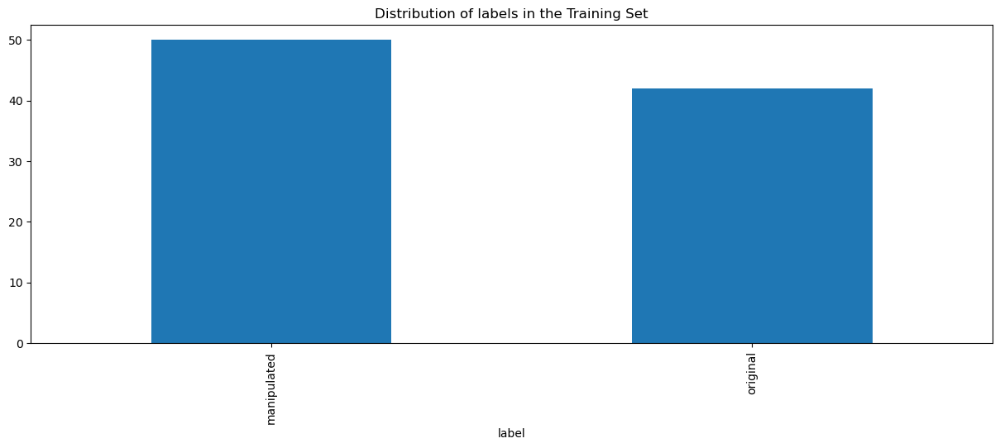

In [10]:
train_sample_metadata.groupby('label')['label'].count().plot(figsize=(15, 5), kind='bar', title='Distribution of labels in the Training Set')
plt.show()

In [11]:
train_sample_metadata.shape

(92, 2)

In [12]:
manipulated_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label == 'manipulated'].sample(10).index)
manipulated_train_sample_video


['01_03__podium_speech_happy__JZUXXFRB.mp4',
 '01_02__hugging_happy__YVGY8LOK.mp4',
 '01_03__outside_talking_still_laughing__JZUXXFRB.mp4',
 '01_02__talking_angry_couch__YVGY8LOK.mp4',
 '01_02__outside_talking_still_laughing__YVGY8LOK.mp4',
 '01_03__kitchen_pan__JZUXXFRB.mp4',
 '01_03__kitchen_still__JZUXXFRB.mp4',
 '01_04__podium_speech_happy__0XUW13RW.mp4',
 '01_03__hugging_happy__ISF9SP4G.mp4',
 '01_04__podium_speech_happy__GBC7ZGDP.mp4']

In [13]:
import cv2
import matplotlib.pyplot as plt
import os

def display_image_from_video(video_path):
    capture_image = cv2.VideoCapture(video_path)
    ret, frame = capture_image.read()
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    ax.imshow(frame)

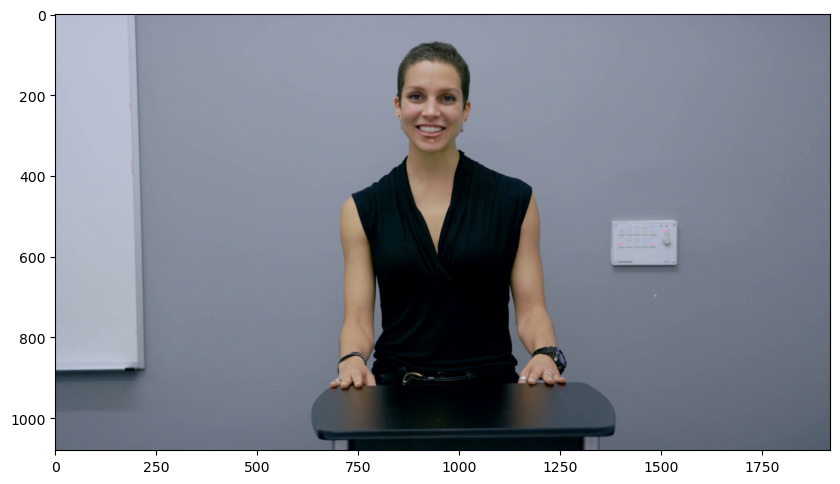

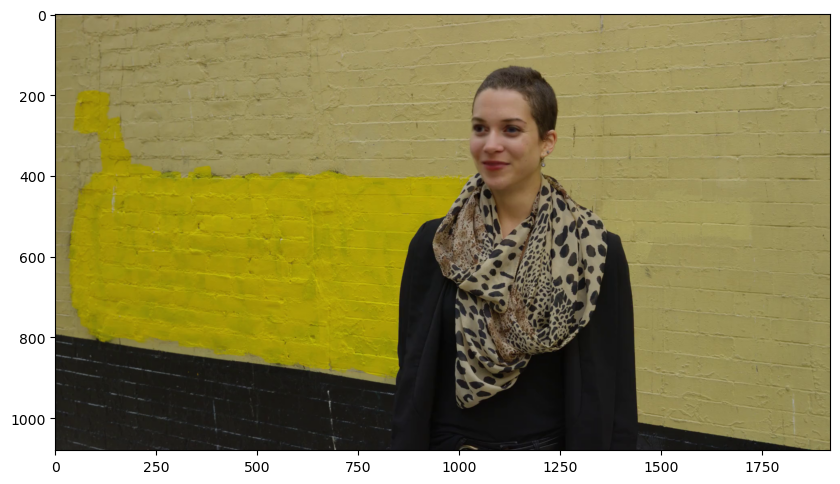

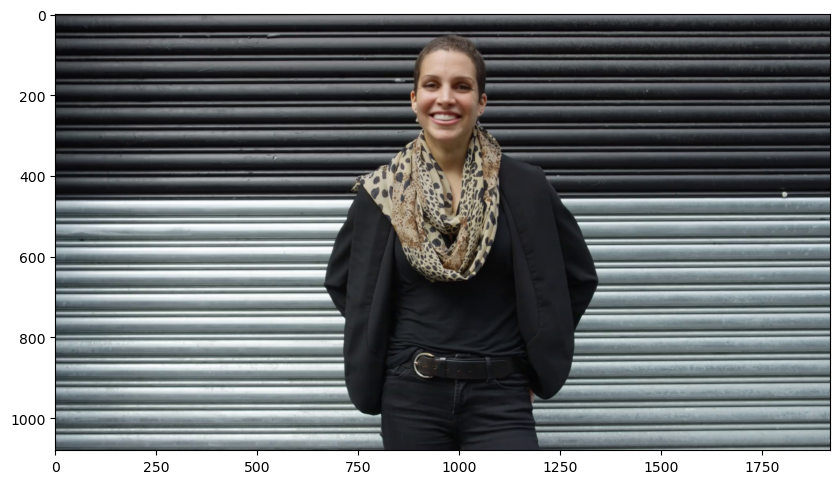

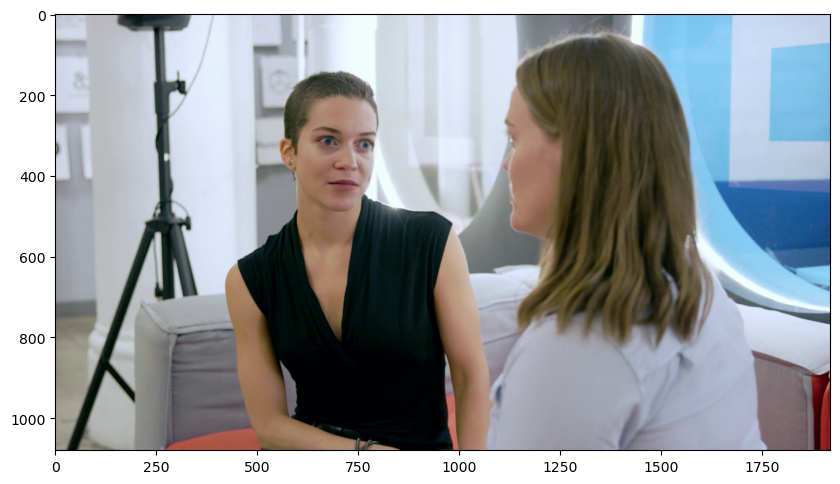

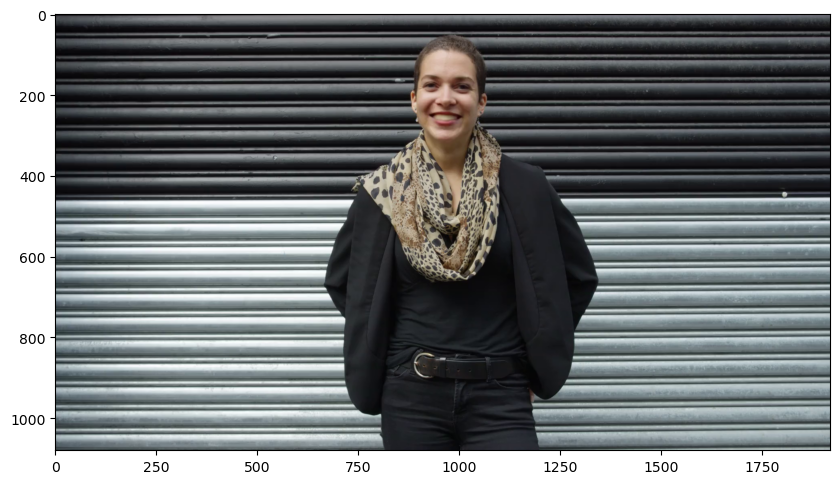

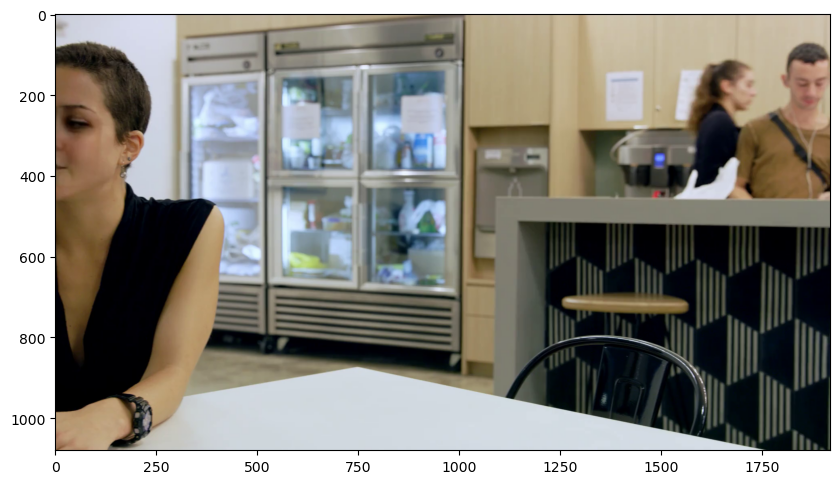

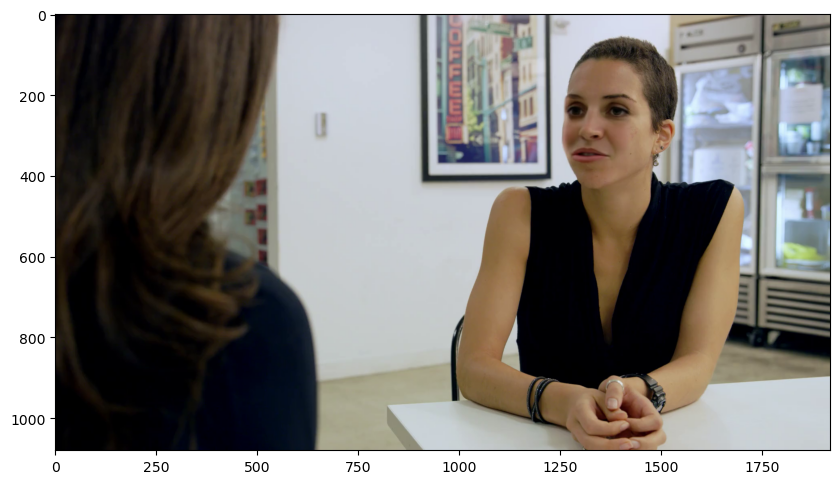

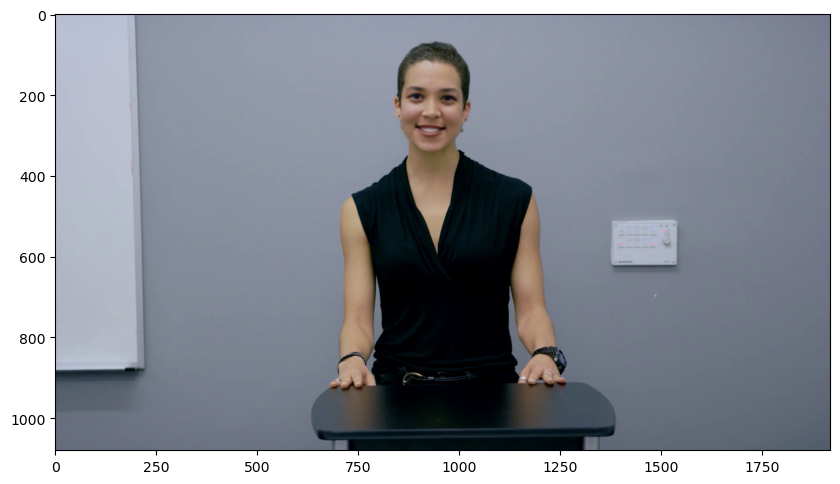

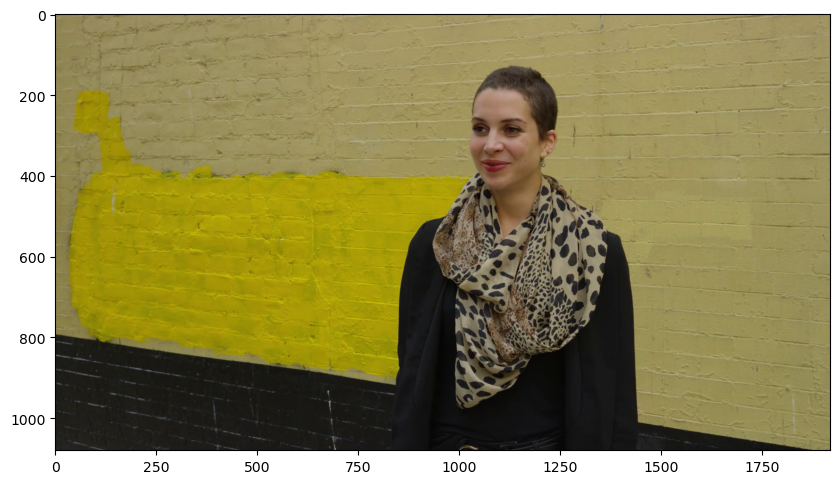

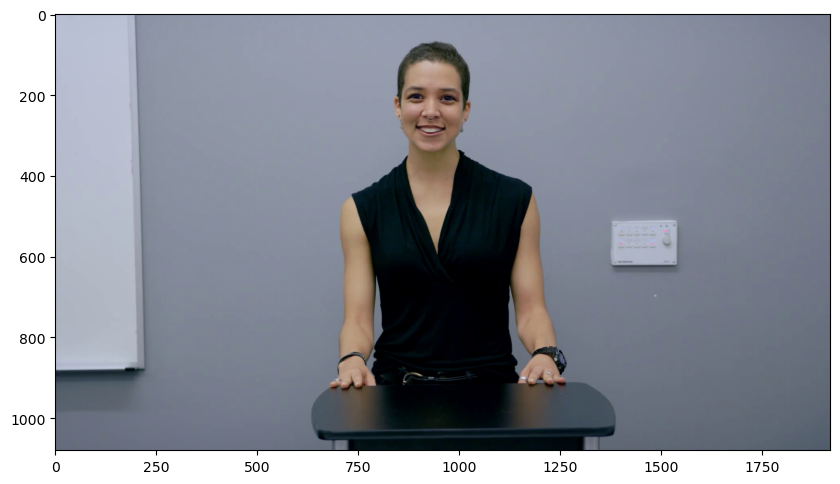

In [14]:
for video_file in manipulated_train_sample_video:
    video_path = os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, "manipulated", video_file)
    display_image_from_video(video_path)


In [15]:
original_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label == 'original'].sample(5).index)
original_train_sample_video


['02__kitchen_pan.mp4',
 '02__hugging_happy.mp4',
 '03__podium_speech_happy.mp4',
 '02__walking_down_street_outside_angry.mp4',
 '03__exit_phone_room.mp4']

In [16]:
def display_image_from_video(video_path):
    capture_image = cv2.VideoCapture(video_path)
    ret, frame = capture_image.read()
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    ax.imshow(frame)

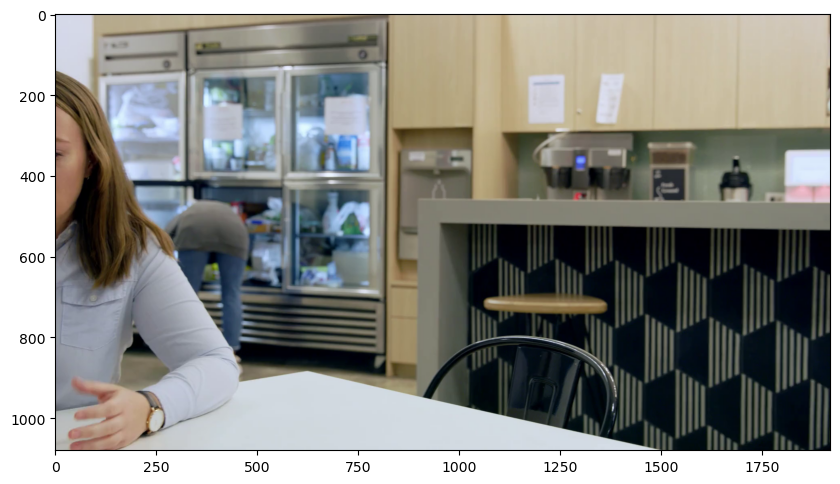

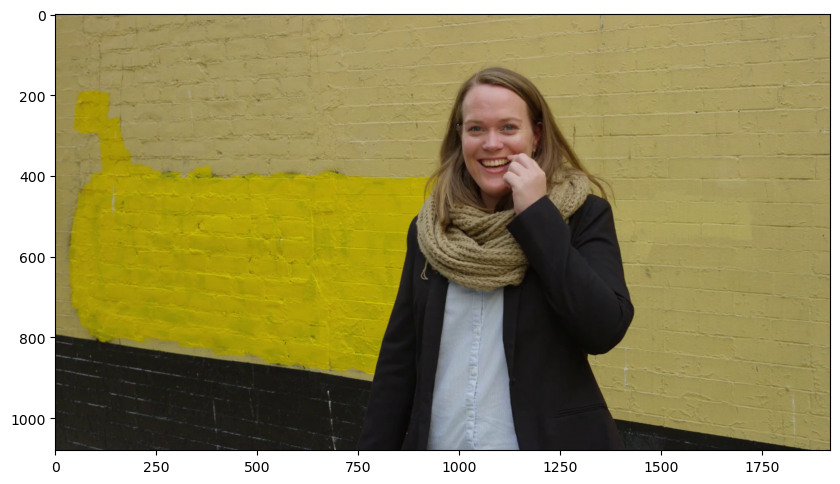

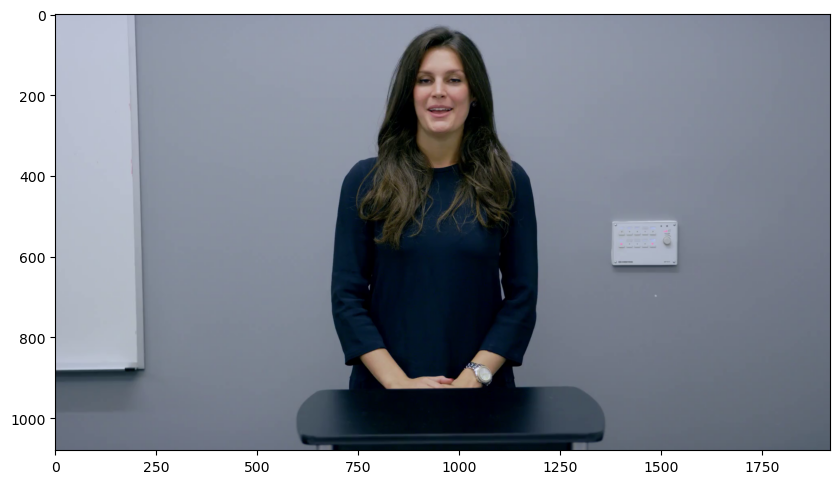

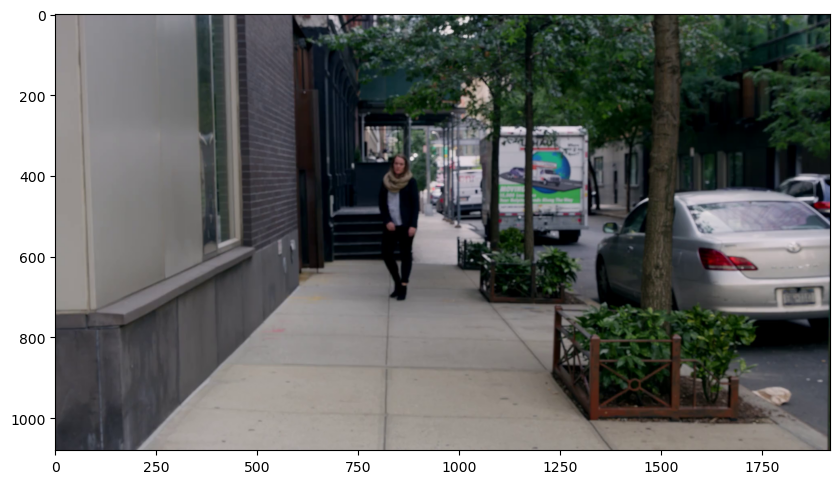

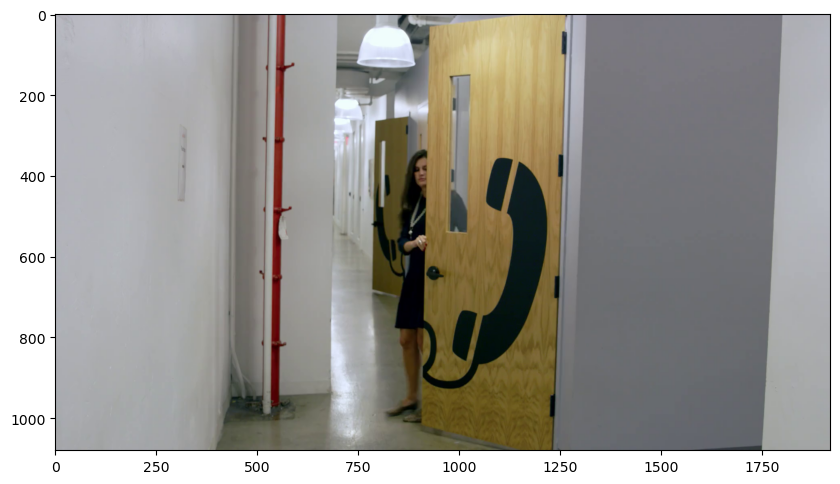

In [17]:
for video_file in original_train_sample_video:
    video_path = os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, "original", video_file)
    display_image_from_video(video_path)

In [18]:
 test_videos = pd.DataFrame(list(os.listdir(os.path.join(DATA_FOLDER, TEST_FOLDER))), columns=['video'])

In [19]:
test_video_paths = []
for label in ['original', 'manipulated']:
    folder_path = os.path.join(DATA_FOLDER, TEST_FOLDER, label)
    for video_file in os.listdir(folder_path):
        test_video_paths.append({
            'video': video_file,
            'label': label,
            'path': os.path.join(folder_path, video_file)
        })

test_videos = pd.DataFrame(test_video_paths)
test_videos.head()


,video,label,path
0,01__meeting_serious.mp4,original,C:/Users/HP/OneDrive - Anglia Ruskin Universit...
1,01__secret_conversation.mp4,original,C:/Users/HP/OneDrive - Anglia Ruskin Universit...
2,01__walking_down_street_outside_angry.mp4,original,C:/Users/HP/OneDrive - Anglia Ruskin Universit...
3,02__kitchen_still.mp4,original,C:/Users/HP/OneDrive - Anglia Ruskin Universit...
4,02__talking_against_wall.mp4,original,C:/Users/HP/OneDrive - Anglia Ruskin Universit...


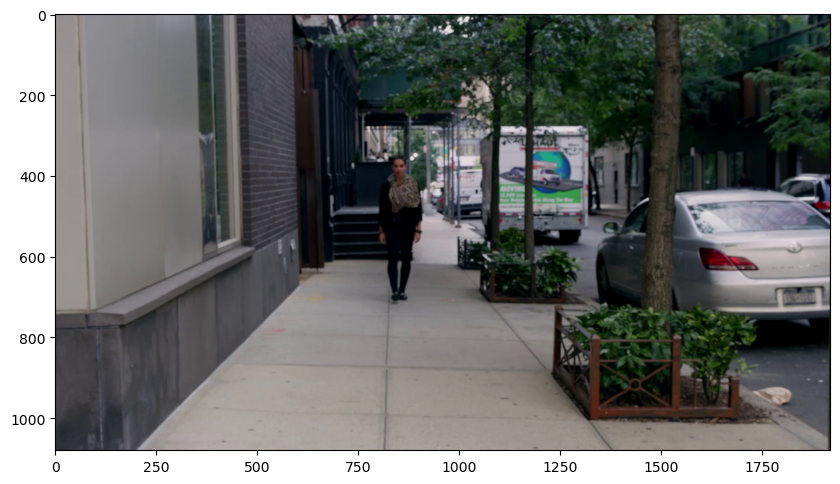

In [20]:
label = test_videos.iloc[2].label 
video_file = test_videos.iloc[2].video
video_path = os.path.join(DATA_FOLDER, TEST_FOLDER, label, video_file)
display_image_from_video(video_path)


In [21]:
manipulated_videos = list(train_sample_metadata.loc[train_sample_metadata.label=='Manipulated'].index)

In [22]:
test_manipulated_path = os.path.join(DATA_FOLDER, TEST_FOLDER, 'manipulated')
print("Path:", test_manipulated_path)
print("Files:", os.listdir(test_manipulated_path))


Path: C:/Users/HP/OneDrive - Anglia Ruskin University/Applications of machine learning/deepfake/data/test\manipulated
Files: ['01_03__kitchen_pan__JZUXXFRB.mp4', '01_03__outside_talking_still_laughing__JZUXXFRB.mp4', '01_03__podium_speech_happy__JZUXXFRB.mp4', '01_04__exit_phone_room__0XUW13RW.mp4', '01_04__hugging_happy__GBC7ZGDP.mp4', '01_04__outside_talking_still_laughing__0XUW13RW.mp4', '01_04__podium_speech_happy__6I623VU9.mp4', '01_04__walk_down_hall_angry__0XUW13RW.mp4', '01_09__talking_angry_couch__O8HNNX43.mp4', '01_11__exit_phone_room__4OJNJLOO.mp4']


In [23]:
manipulated_test_folder = os.path.join(DATA_FOLDER, TEST_FOLDER, 'manipulated')

manipulated_videos = [
    os.path.join(manipulated_test_folder, f)
    for f in os.listdir(manipulated_test_folder)
    if f.endswith('.mp4')
]

print(f"Found {len(manipulated_videos)} videos.")


Found 10 videos.


In [32]:
from IPython.display import HTML
from base64 import b64encode

def play_video(video_name):
    for subfolder in ["manipulated", "original"]:
        video_path = os.path.join(DATA_FOLDER, TEST_FOLDER, subfolder, video_name)
        if os.path.exists(video_path):
            with open(video_path, "rb") as f:
                video_bytes = f.read()
            data_url = "data:video/mp4;base64," + b64encode(video_bytes).decode()
            return HTML(f"""<video width=500 controls><source src="{data_url}" type="video/mp4"></video>""")
    
    print(f"Video '{video_name}' not found in 'manipulated' or 'original' folders.")
    return None
    
play_video(manipulated_videos[0])

In [34]:
IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 30

MAX_SEQ_LENGTH = 20
NUM_FEATURES = 2048

In [36]:
 def crop_center_square(frame):
     y, x =  frame.shape[0:2]
     min_dim = min(y, x)
     start_x = (x // 2) - (min_dim // 2)
     start_y = (y // 2) - (min_dim // 2)
     return frame [start_y : start_y + min_dim, start_x : start_x + min_dim]

def load_video(path, max_frames=0, resize=(IMG_SIZE< IMG_SIZE)):
    cap = cv2.VideoCapture(path)
    frames = []
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            frame = crop_center_square(frame)
            frame = cv2.resize(frame, resize)
            frame = frame[:,:,[2, 1, 0]]
            frames.append(frame)

            if len(frames) == max_frames:
                break

    finally:
        cap.release()
    return np.array(frames)

In [38]:
def build_feature_extractor():
    feature_extractor = keras.applications.InceptionV3(
        weights="imagenet",
        include_top=False,
        pooling="avg",
        input_shape=(IMG_SIZE, IMG_SIZE, 3),
    )
    preprocess_input = keras.applications.inception_v3.preprocess_input

    inputs = keras.Input((IMG_SIZE, IMG_SIZE, 3))
    preprocessed = preprocess_input(inputs)

    outputs = feature_extractor(preprocessed)
    return keras.Model(inputs, outputs, name="feature_extractor")

feature_extractor = build_feature_extractor()

In [40]:
def prepare_all_videos(df, root_dir):
    num_samples = len(df)
    video_paths = list(df.index)
    labels = df["label"].values
    labels = np.array(labels == 'MANIPULATED').astype(int)

    frame_masks = np.zeros(shape=(num_samples, MAX_SEQ_LENGTH), dtype="bool")
    frame_features = np.zeros(
        shape=(num_samples, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
    )

    for idx, path in enumerate(video_paths):
        frames = load_video(os.path.join(root_dir, path))
        frames = frames[None, ...]

        temp_frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
        temp_frame_features = np.zeros(shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")



        for i, batch in enumerate(frames):
            video_length = batch.shape[0]
            length = min(MAX_SEQ_LENGTH, video_length)
            for j in range(length):
                temp_frame_features[i, j, :] = feature_extractor.predict(
                    batch[None, j,:] 
                )
            temp_frame_mask[i, :length] = 1
        frame_features[idx,] = temp_frame_features.squeeze()
        frame_masks[idx,] = temp_frame_mask.squeeze()

    return (frame_features, frame_masks), labels

In [42]:
from sklearn.model_selection import train_test_split

Train_set, Test_set = train_test_split(train_sample_metadata,test_size=0.2,random_state=42,stratify=train_sample_metadata['label'])
print(Train_set.shape, Test_set.shape )

(73, 2) (19, 2)


In [44]:
train_data, train_labels = prepare_all_videos(Train_set, "train")
test_data, test_labels = prepare_all_videos(Test_set, "test")

print(f"Frame features in train set: {train_data[0].shape}")
print(f"Frame masks in train set: {train_data[1].shape}")

Frame features in train set: (73, 20, 2048)
Frame masks in train set: (73, 20)


In [46]:
frame_features_input = keras.Input((MAX_SEQ_LENGTH, NUM_FEATURES))
mask_input = keras.Input((MAX_SEQ_LENGTH,), dtype="bool")
x = keras.layers.GRU(64, return_sequences=True)(frame_features_input, mask=mask_input)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.GRU(32, return_sequences=True)(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.GRU(16)(x)
x = keras.layers.Dropout(0.5)(x)
x = keras.layers.Dense(32, activation="relu")(x)
x = keras.layers.Dropout(0.5)(x)
output = keras.layers.Dense(1, activation="sigmoid")(x)

model = keras.Model([frame_features_input, mask_input], output)

optimizer = keras.optimizers.Adam(learning_rate=1e-4)




In [48]:
model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 20, 2048)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_3       │ (None, 20)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru (GRU)           │ (None, 20, 64)    │    405,888 │ input_layer_2[0]… │
│                     │                   │            │ input_layer_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 20, 64)    │        256 │ gru[0][0]         │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_1 (GRU)         │ (None, 20, 32)    │      9,408 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 20, 32)    │        128 │ gru_1[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_2 (GRU)         │ (None, 16)        │      2,400 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 16)        │          0 │ gru_2[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 32)        │        544 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 32)        │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 1)         │         33 │ dropout_1[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 418,657 (1.60 MB)

 Trainable params: 418,465 (1.60 MB)

 Non-trainable params: 192 (768.00 B)

In [50]:
es = keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
mc = keras.callbacks.ModelCheckpoint('best_model.weights.h5', save_weights_only=True, save_best_only=True)


In [52]:
history = model.fit([train_data[0], train_data[1]],
                    train_labels,
                    validation_data=([test_data[0], test_data[1]], test_labels),
                    callbacks=[mc, es],
                    epochs=EPOCHS,
                    batch_size=16
                   )

Epoch 1/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 21s 829ms/step - accuracy: 1.0000 - loss: 0.6931 - val_accuracy: 1.0000 - val_loss: 0.6929
Epoch 2/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - accuracy: 1.0000 - loss: 0.6928 - val_accuracy: 1.0000 - val_loss: 0.6926
Epoch 3/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - accuracy: 1.0000 - loss: 0.6926 - val_accuracy: 1.0000 - val_loss: 0.6924
Epoch 4/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - accuracy: 1.0000 - loss: 0.6923 - val_accuracy: 1.0000 - val_loss: 0.6921
Epoch 5/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 227ms/step - accuracy: 1.0000 - loss: 0.6921 - val_accuracy: 1.0000 - val_loss: 0.6919
Epoch 6/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 214ms/step - accuracy: 1.0000 - loss: 0.6918 - val_accuracy: 1.0000 - val_loss: 0.6916
Epoch 7/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 1.0000 - loss: 0.6916 - val_accuracy: 1.0000 - val_loss: 0.6914
Epoch 8/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 266ms/step - accuracy: 1.0000 - loss: 0.6913 - val_accuracy: 1.0000 - val_loss

In [54]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(accuracy) + 1)

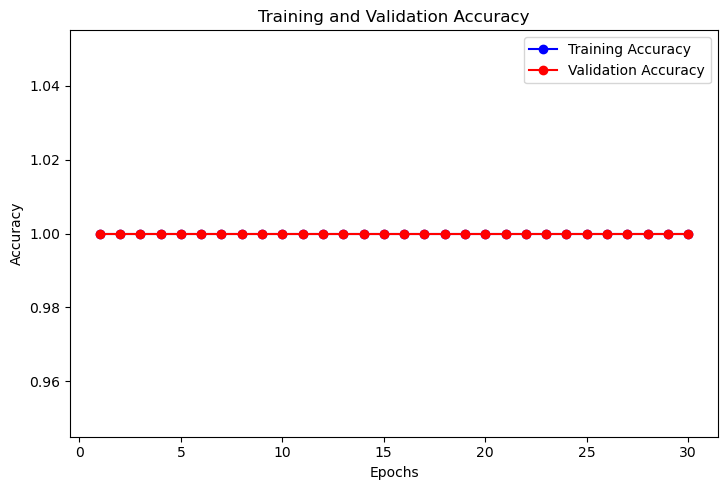

In [56]:
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, accuracy, 'bo-', label='Training Accuracy')
plt.plot(epochs, val_accuracy, 'ro-', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


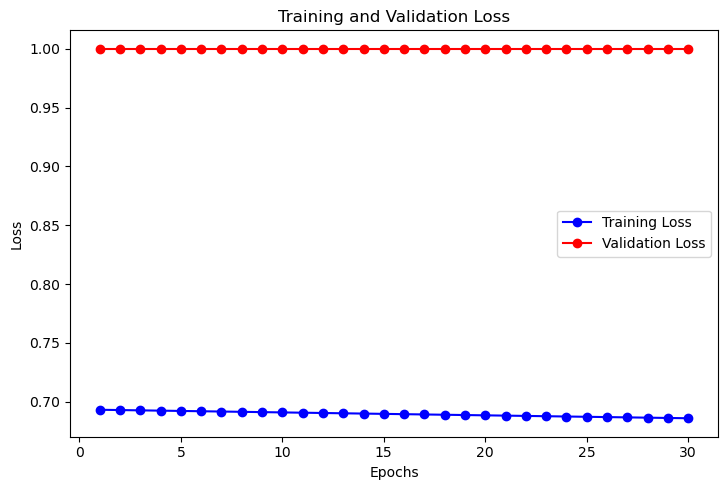

In [58]:
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 2)
plt.plot(epochs, loss, 'bo-', label='Training Loss')
plt.plot(epochs, val_accuracy, 'ro-', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [62]:
def prepare_single_video(frames):

    num_frames = frames.shape[0]
    length = min(num_frames, MAX_SEQ_LENGTH)

    frame_features = np.zeros((1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")
    frame_mask = np.zeros((1, MAX_SEQ_LENGTH), dtype="bool")

    for j in range(length):
        frame_features[0, j, :] = feature_extractor.predict(frames[:, j, :])[0]
    frame_mask[0, :length] = 1

    return frame_features, frame_mask


def sequence_prediction(path):
    frames = load_video(os.path.join(DATA_FOLDER, TEST_FOLDER,path))
    frame_features, frame_mask = prepare_single_video(frames)
    return model.predict([frame_features, frame_mask])[0]

def to_gif(images):
    converted_images = images.astype(np.uint8)
    imageio.mimsave("animation.gif", converted_images, fps=10)
    return embed.embed_file("animation.gif")

test_video = np.random.choice(test_videos["video"].values.tolist())
print(f"Test video path: {test_video}")

if(sequence_prediction(test_video)>=0.5):
    print(f'The predicted class of the video is MANIPULATED')

else:
    print(f'The predicted class of the video is ORIGINAL')

play_video(test_video,)


Test video path: 02__walking_outside_cafe_disgusted.mp4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
The predicted class of the video is ORIGINAL


In [64]:
model.save('deepfake_video_model.keras')